In [1]:
import gcsfs
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import cartopy.crs as ccrs
#import statsmodels.api as sm
#import statsmodels.formula.api as smf
#import seaborn as sns
import cftime

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
fs = gcsfs.GCSFileSystem()

mapper = fs.get_mapper("gs://leap-persistent/yiqioyang/cam6_PD_monthly_prec.zarr")
ds_xr = xr.open_dataset(mapper, engine = 'zarr')

param_mapper = fs.get_mapper('gs://leap-persistent/kylemcevoy/cesm2_ppe_param_set.zarr')
param_xr = xr.open_dataset(param_mapper, engine = 'zarr')

param_df = param_xr.to_pandas()

In [3]:
fs.ls('gs://leap-persistent/kylemcevoy/')

['leap-persistent/kylemcevoy/amip_prec_q90.zarr',
 'leap-persistent/kylemcevoy/cam6_pd_monthly_flut_ppe.zarr',
 'leap-persistent/kylemcevoy/cam6_pd_monthly_flut_ppe2.zarr',
 'leap-persistent/kylemcevoy/ceres_toa.zarr',
 'leap-persistent/kylemcevoy/cesm2_le50_prec_quantile090.nc',
 'leap-persistent/kylemcevoy/cesm2_le50_prec_quantile095.nc',
 'leap-persistent/kylemcevoy/cesm2_le_prec_quantile095.nc',
 'leap-persistent/kylemcevoy/cesm2_ppe_param_set.zarr']

In [4]:
quant_mapper = fs.get_mapper('gs://leap-persistent/kylemcevoy/cesm2_le50_prec_quantile095.nc')
cesm2_le50_q95 = xr.open_dataset(quant_mapper, engine = 'zarr')

In [5]:
quant90_mapper = fs.get_mapper('gs://leap-persistent/kylemcevoy/cesm2_le50_prec_quantile090.nc')
cesm2_le50_q90 = xr.open_dataset(quant90_mapper, engine = 'zarr')

In [6]:
cesm2_le50_q95['PREC']

<xarray.DataArray 'PREC' (ensemble: 50, lat: 192, lon: 288)> Size: 22MB
[2764800 values with dtype=float64]
Coordinates:
  * ensemble  (ensemble) int64 400B 0 1 2 3 4 5 6 7 ... 42 43 44 45 46 47 48 49
  * lat       (lat) float64 2kB -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon       (lon) float64 2kB 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8
    quantile  float64 8B ...

In [7]:
cesm2_le50_q90['PREC']

<xarray.DataArray 'PREC' (ensemble: 50, lat: 192, lon: 288)> Size: 22MB
[2764800 values with dtype=float64]
Coordinates:
  * ensemble  (ensemble) int64 400B 0 1 2 3 4 5 6 7 ... 42 43 44 45 46 47 48 49
  * lat       (lat) float64 2kB -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon       (lon) float64 2kB 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8
    quantile  float64 8B ...

In [8]:
ds_dask = ds_xr.chunk({'ensemble': 262, 'time': 36, 'lat': 24, 'lon': 32})

In [9]:
ds_dask['PRECC']

<xarray.DataArray 'PRECC' (ensemble: 262, time: 36, lat: 192, lon: 288)> Size: 2GB
dask.array<xarray-PRECC, shape=(262, 36, 192, 288), dtype=float32, chunksize=(262, 36, 24, 32), chunktype=numpy.ndarray>
Coordinates:
  * ensemble  (ensemble) int64 2kB 0 1 2 3 4 5 6 ... 256 257 258 259 260 261 262
  * lat       (lat) float64 2kB -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon       (lon) float64 2kB 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8
  * time      (time) object 288B 0001-01-16 12:00:00 ... 0003-12-16 12:00:00
Attributes:
    cell_methods:  time: mean
    long_name:     Convective precipitation rate (liq + ice)
    units:         m/s

In [10]:
ds_dask2 = ds_dask['PRECC'] + ds_dask['PRECL']

In [11]:
ds_prec = ds_dask2.compute()

In [12]:
ppe_prec_quant95 = ds_prec.quantile(0.95, dim = 'time')

In [17]:
cesm2_le50_q95['lat'] = ppe_prec_quant95['lat']

In [19]:
np.max(cesm2_le50_q95.lat.values - ppe_prec_quant95.lat.values)

0.0

In [20]:
np.max(ppe_prec_quant95.lon.values - cesm2_le50_q95.lon.values)

0.0

In [21]:
upper_bnd = np.max([np.max(cesm2_le50_q95['PREC'].mean(dim = 'ensemble').values), np.max(ppe_prec_quant95.mean(dim = 'ensemble')).values])

In [22]:
std_upper_bnd = np.max([np.max(ppe_prec_quant95.std(dim='ensemble').values),
                        np.max(cesm2_le50_q95['PREC'].std(dim='ensemble').values)])

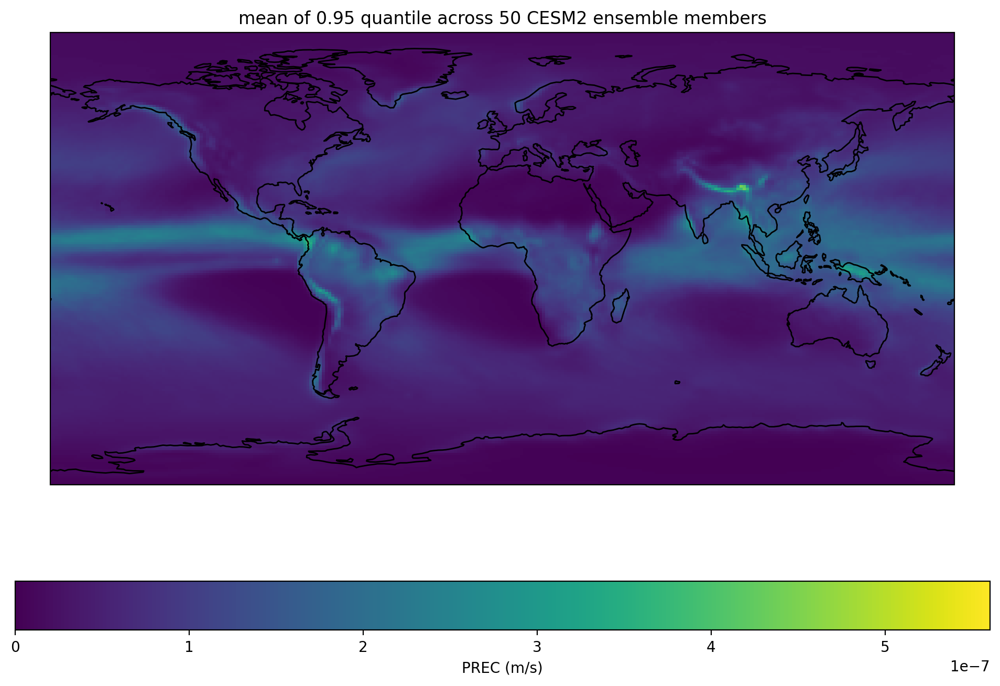

In [23]:
cesm_quant_plot_mean = (cesm2_le50_q95['PREC'].mean(dim ='ensemble').
                   plot(figsize=(12, 8),
                        vmin = 0,
                        vmax = upper_bnd,
                        subplot_kws={'transform': ccrs.PlateCarree(),
                                     'projection': ccrs.PlateCarree()},
                        cbar_kwargs={'orientation': 'horizontal',
                                    'label': 'PREC (m/s)'}))
cesm_quant_plot_mean.axes.coastlines()
plt.title('mean of 0.95 quantile across 50 CESM2 ensemble members');
plt.savefig('cesm2_le50_prec_mean_095_quantile_plot.png')

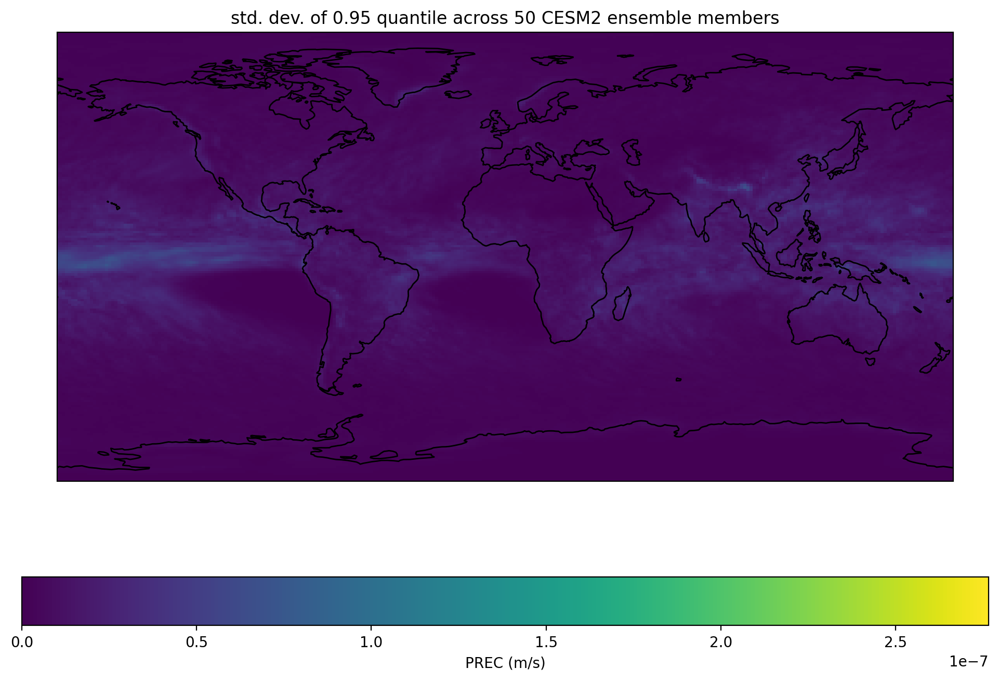

In [25]:
cesm2_quant_plot_std = (cesm2_le50_q95['PREC'].std(dim='ensemble').
              plot(figsize=(12, 8),
                   vmin = 0,
                   vmax = std_upper_bnd,
                   subplot_kws={'transform': ccrs.PlateCarree(),
                                'projection': ccrs.PlateCarree()},
                   cbar_kwargs={'orientation': 'horizontal',
                               'label': 'PREC (m/s)'}))
cesm2_quant_plot_std.axes.coastlines()
plt.title('std. dev. of 0.95 quantile across 50 CESM2 ensemble members');
plt.savefig('cesm2_le50_prec_std_095_quantile_plot.png')

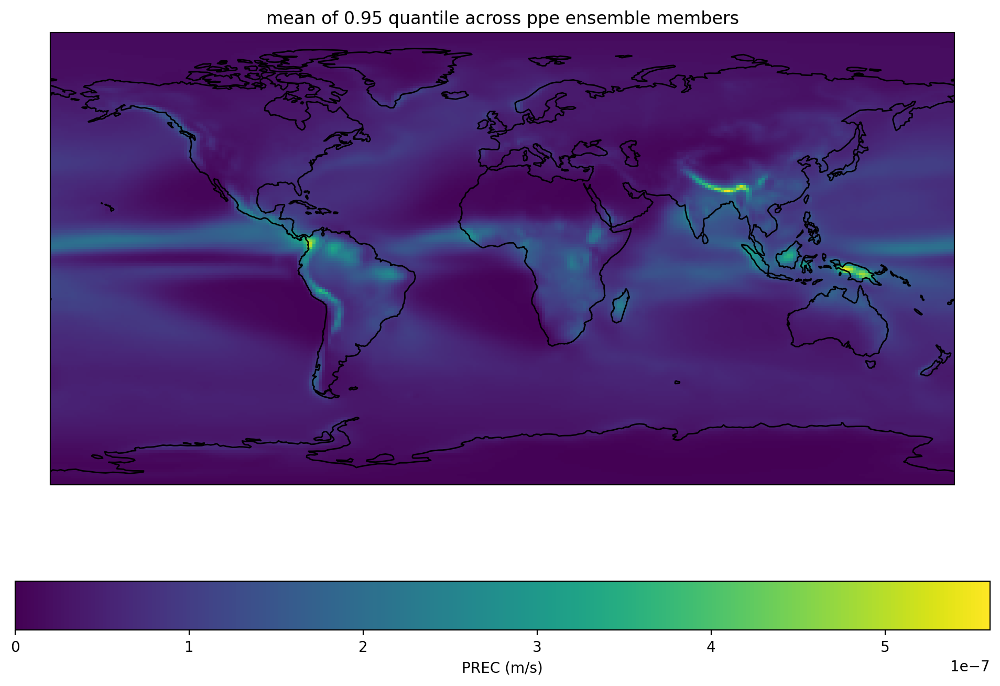

In [26]:
quant_plot_mean = (ppe_prec_quant95.mean(dim ='ensemble').
                   plot(figsize=(12, 8),
                        vmin = 0,
                        vmax = upper_bnd,
                        subplot_kws={'transform': ccrs.PlateCarree(),
                                     'projection': ccrs.PlateCarree()},
                        cbar_kwargs={'orientation': 'horizontal',
                                    'label': 'PREC (m/s)'}))
quant_plot_mean.axes.coastlines()
plt.title('mean of 0.95 quantile across ppe ensemble members');
plt.savefig('ppe_prec_mean_095_quantile_plot.png')

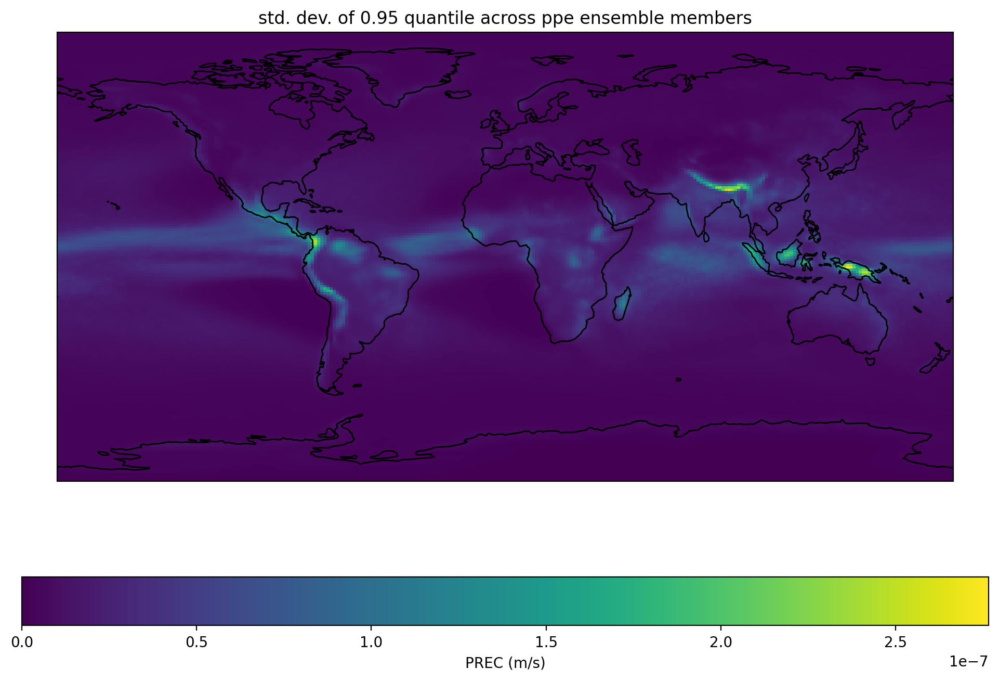

In [27]:
quant_plot_std = (ppe_prec_quant95.std(dim='ensemble').
              plot(figsize=(12, 8),
                   vmin = 0,
                   vmax = std_upper_bnd,
                   subplot_kws={'transform': ccrs.PlateCarree(),
                                'projection': ccrs.PlateCarree()},
                   cbar_kwargs={'orientation': 'horizontal',
                               'label': 'PREC (m/s)'}))
quant_plot_std.axes.coastlines()
plt.title('std. dev. of 0.95 quantile across ppe ensemble members');
plt.savefig('ppe_prec_std_095_quantile_plot.png')

In [13]:
cesm2_le_q95

<xarray.Dataset> Size: 4MB
Dimensions:   (ensemble: 10, lat: 192, lon: 288)
Coordinates:
  * ensemble  (ensemble) int64 80B 0 1 2 3 4 5 6 7 8 9
  * lat       (lat) float64 2kB -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon       (lon) float64 2kB 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8
    quantile  float64 8B ...
Data variables:
    PREC      (ensemble, lat, lon) float64 4MB 5.085e-09 5.085e-09 ... 1.162e-08

In [13]:
quant95_mean_diff = ppe_prec_quant95.mean(dim='ensemble') - cesm2_le50_q95.mean(dim = 'ensemble')

In [29]:
quant95_std_ratio =  ppe_prec_quant95.std(dim='ensemble') / cesm2_le50_q95.std(dim = 'ensemble')

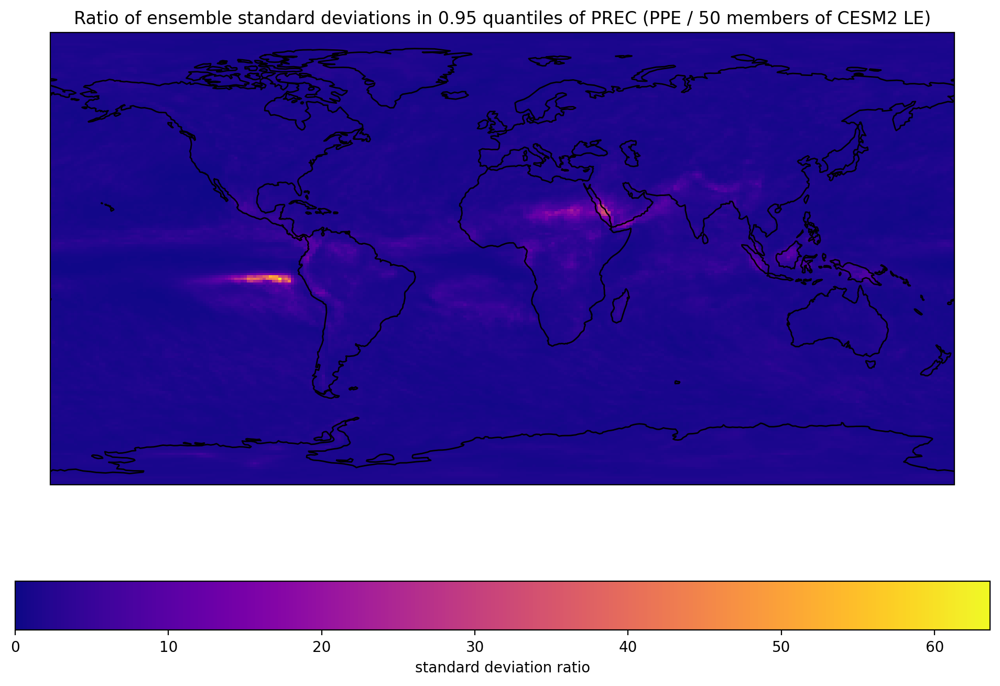

In [30]:
quant_plot_std_ratio = (quant95_std_ratio['PREC'].
              plot(figsize=(12, 8),
                   vmin = 0,
                   cmap = 'plasma',
                   subplot_kws={'transform': ccrs.PlateCarree(),
                                'projection': ccrs.PlateCarree()},
                   cbar_kwargs={'orientation': 'horizontal',
                               'label': 'standard deviation ratio'}))
quant_plot_std_ratio.axes.coastlines()
plt.title('Ratio of ensemble standard deviations in 0.95 quantiles of PREC (PPE / 50 members of CESM2 LE)');
plt.savefig('prec_std_ratio_095_quantle50_plot.png')

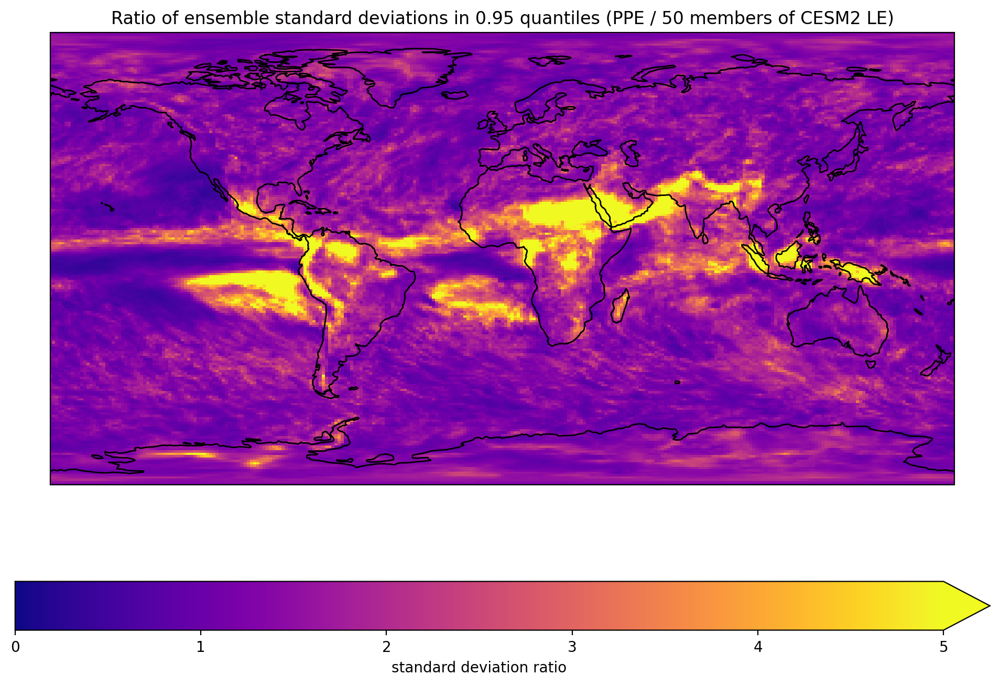

In [33]:
quant_plot_std_ratio_cl = (quant95_std_ratio['PREC'].
              plot(figsize=(12, 8),
                   cmap = 'plasma',
                   vmin = 0,
                   vmax = 5,
                   subplot_kws={'transform': ccrs.PlateCarree(),
                                'projection': ccrs.PlateCarree()},
                   cbar_kwargs={'orientation': 'horizontal',
                               'label': 'standard deviation ratio'}))
quant_plot_std_ratio_cl.axes.coastlines()
plt.title('Ratio of ensemble standard deviations in 0.95 quantiles (PPE / 50 members of CESM2 LE)');
plt.savefig('prec_std_ratio_095_le50_quant_plot_cl.png')

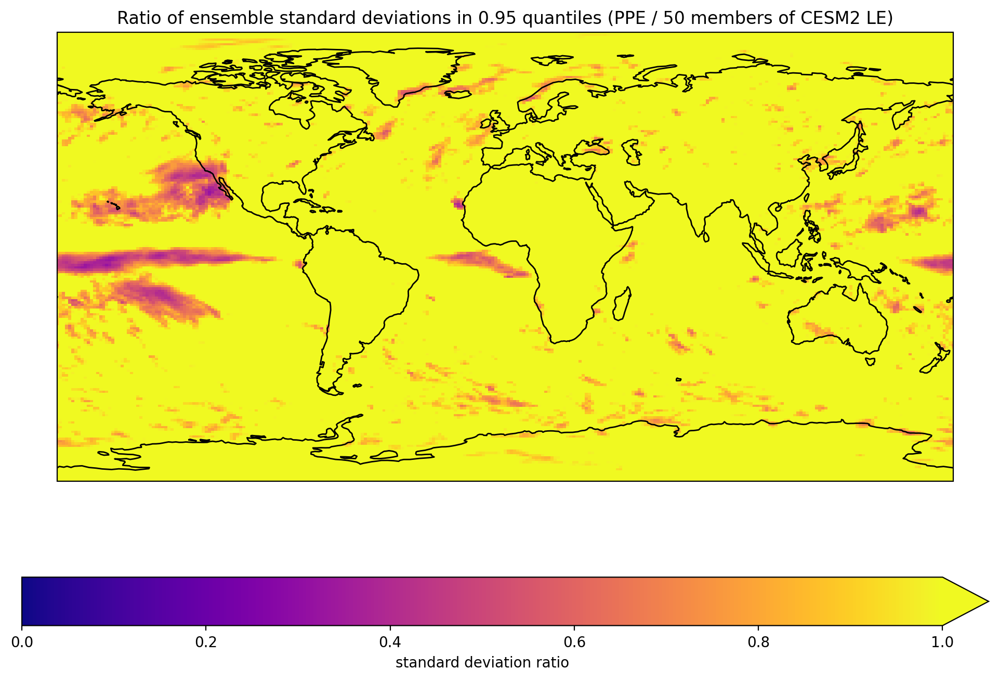

In [34]:
quant_plot_std_ratio_capped = (quant95_std_ratio['PREC'].
              plot(figsize=(12, 8),
                   cmap = 'plasma',
                   vmin = 0,
                   vmax = 1,
                   subplot_kws={'transform': ccrs.PlateCarree(),
                                'projection': ccrs.PlateCarree()},
                   cbar_kwargs={'orientation': 'horizontal',
                               'label': 'standard deviation ratio'}))
quant_plot_std_ratio_capped.axes.coastlines()
plt.title('Ratio of ensemble standard deviations in 0.95 quantiles (PPE / 50 members of CESM2 LE)');
plt.savefig('prec_std_ratio_095_le50_quant_plot_capped1.png')

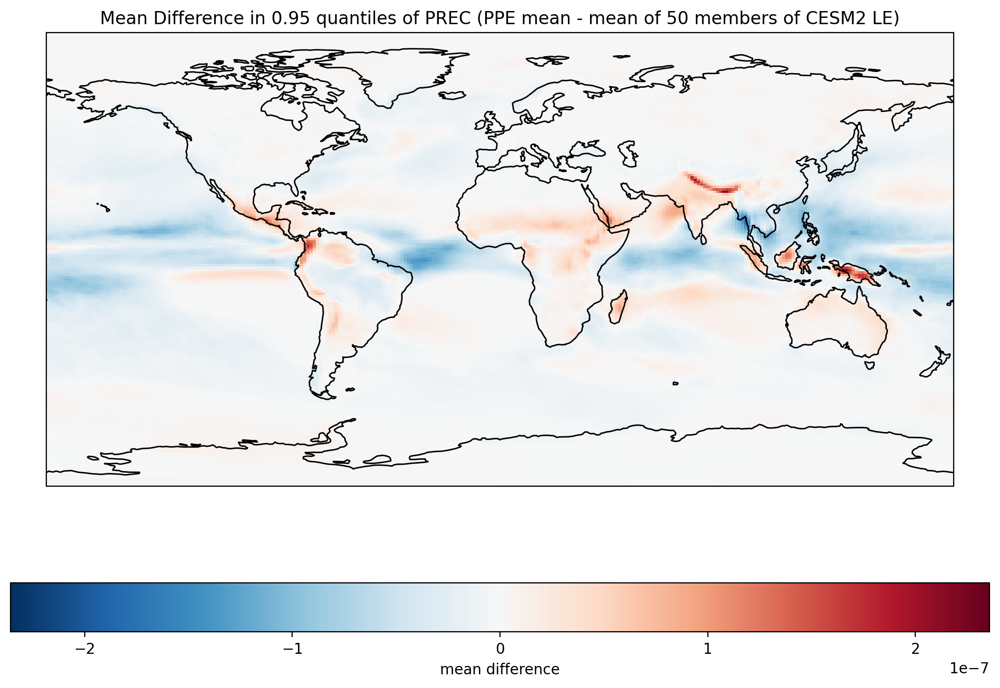

In [32]:
quant_plot_mean_diff = (quant95_mean_diff['PREC'].
              plot(figsize=(12, 8),
                   cmap = 'RdBu_r',
                   vmin = -np.max(quant95_mean_diff['PREC']),
                   vmax = np.max(quant95_mean_diff['PREC']),
                   subplot_kws={'transform': ccrs.PlateCarree(),
                                'projection': ccrs.PlateCarree()},
                   cbar_kwargs={'orientation': 'horizontal',
                               'label': 'mean difference'}))
quant_plot_mean_diff.axes.coastlines()
plt.title('Mean Difference in 0.95 quantiles of PREC (PPE mean - mean of 50 members of CESM2 LE)');
plt.savefig('mean_diff_095_quant_le50_plot.png')

# Quantile 0.90


In [20]:
ppe_prec_quant90 = ds_prec.quantile(0.90, dim = 'time')

In [21]:
cesm2_le50_q90['lat'] = ppe_prec_quant90['lat']

In [22]:
np.max(cesm2_le50_q90.lat.values - ppe_prec_quant90.lat.values)

0.0

In [18]:
np.max(ppe_prec_quant90.lon.values - cesm2_le50_q90.lon.values)

0.0

In [19]:
60 * 60 * 24

86400

In [23]:
cesm2_le50_q90['PREC'] = cesm2_le50_q90['PREC'] * (60 * 60 * 24 * 1000.)

In [24]:
ppe_prec_quant90 = ppe_prec_quant90 * (60 * 60 * 24 * 1000.)

In [25]:
cesm2_le50_q90['PREC'].values

array([[[0.3437046 , 0.3437046 , 0.3437046 , ..., 0.34370462,
         0.34370462, 0.34370462],
        [0.37080479, 0.37089198, 0.37124673, ..., 0.36981108,
         0.37040565, 0.37083399],
        [0.30973593, 0.30587802, 0.30301699, ..., 0.31688319,
         0.31336523, 0.31159173],
        ...,
        [1.16470632, 1.15851931, 1.15688017, ..., 1.16934974,
         1.1701441 , 1.16796775],
        [0.98195807, 0.98183893, 0.98411005, ..., 0.97934239,
         0.98041071, 0.98106425],
        [0.92676562, 0.92905155, 0.92944641, ..., 0.92893778,
         0.92749165, 0.92616035]],

       [[0.29095275, 0.29095275, 0.29095275, ..., 0.29095277,
         0.29095277, 0.29095238],
        [0.30062285, 0.30066335, 0.30082842, ..., 0.29966358,
         0.30006871, 0.30034451],
        [0.28115596, 0.27965215, 0.27829186, ..., 0.28603118,
         0.2841085 , 0.28237725],
        ...,
        [1.17201617, 1.1779841 , 1.18276085, ..., 1.1405591 ,
         1.15544531, 1.16611639],
        [1.1

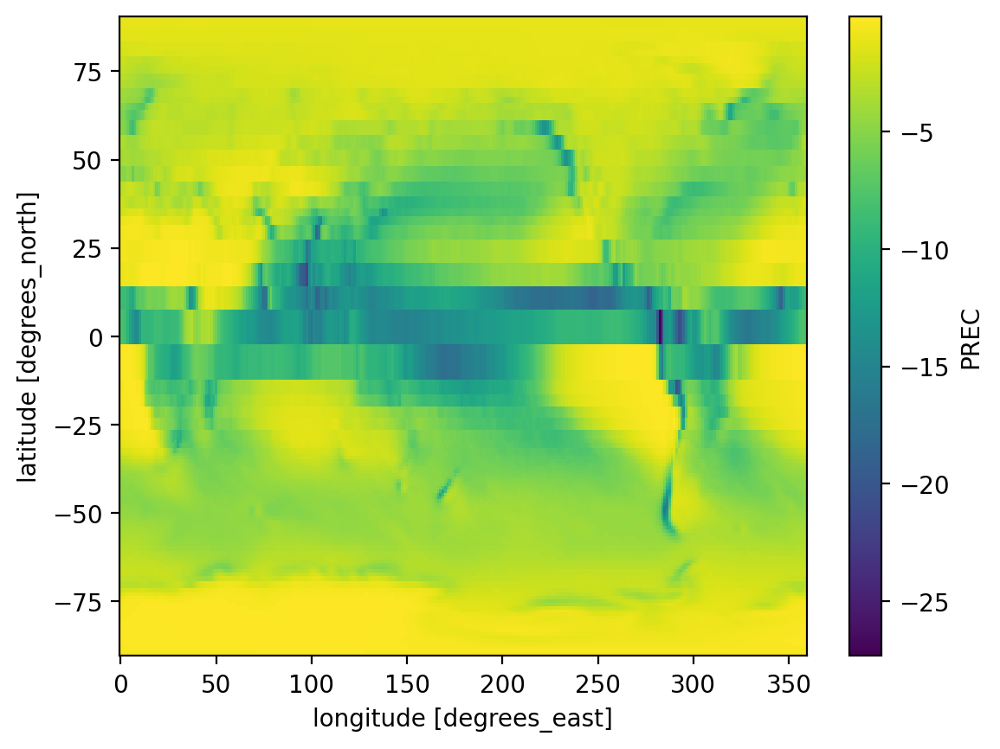

In [26]:
(cesm2_le50_q95 - cesm2_le50_q90).mean('ensemble')['PREC'].plot()

In [27]:
upper_bnd = np.max([np.max(cesm2_le50_q90['PREC'].mean(dim = 'ensemble').values), np.max(ppe_prec_quant90.mean(dim = 'ensemble')).values])

In [28]:
std_upper_bnd = np.max([np.max(ppe_prec_quant90.std(dim='ensemble').values),
                        np.max(cesm2_le50_q90['PREC'].std(dim='ensemble').values)])

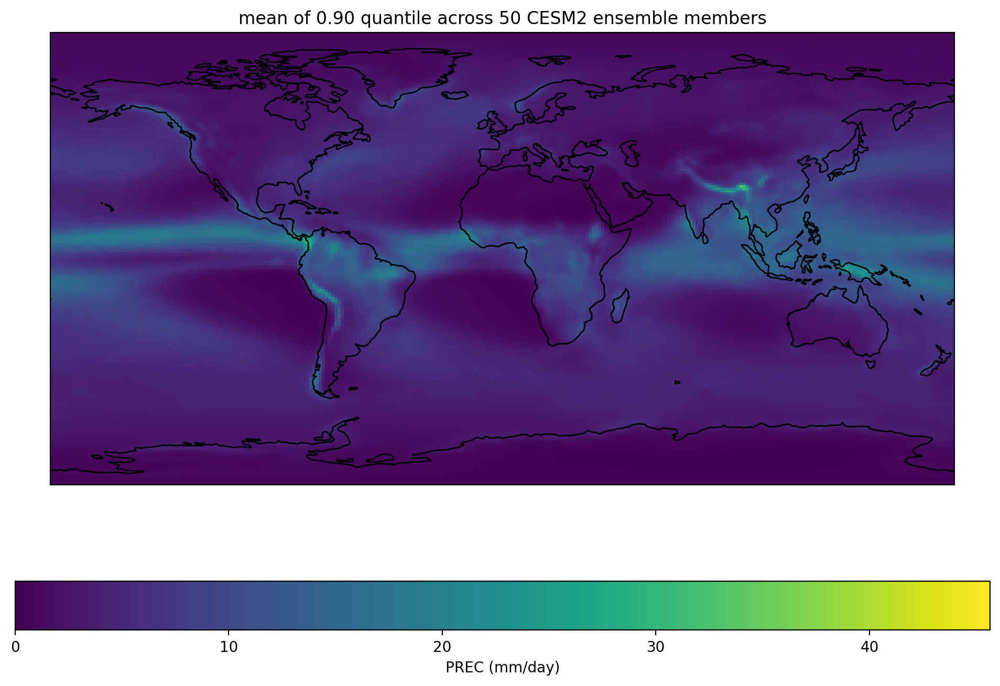

In [29]:
cesm_quant_plot_mean = (cesm2_le50_q90['PREC'].mean(dim ='ensemble').
                   plot(figsize=(12, 8),
                        vmin = 0,
                        vmax = upper_bnd,
                        subplot_kws={'transform': ccrs.PlateCarree(),
                                     'projection': ccrs.PlateCarree()},
                        cbar_kwargs={'orientation': 'horizontal',
                                    'label': 'PREC (mm/day)'}))
cesm_quant_plot_mean.axes.coastlines()
plt.title('mean of 0.90 quantile across 50 CESM2 ensemble members');
plt.savefig('cesm2_le50_prec_mean_090_quantile_plot.png')

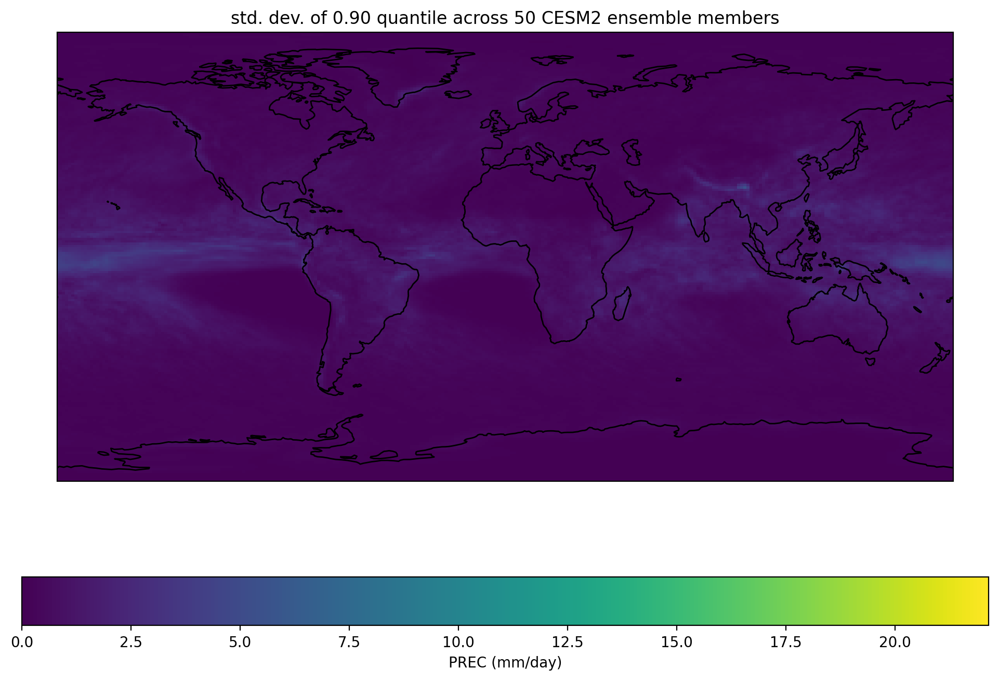

In [33]:
cesm2_quant_plot_std = (cesm2_le50_q90['PREC'].std(dim='ensemble').
              plot(figsize=(12, 8),
                   vmin = 0,
                   vmax = std_upper_bnd,
                   subplot_kws={'transform': ccrs.PlateCarree(),
                                'projection': ccrs.PlateCarree()},
                   cbar_kwargs={'orientation': 'horizontal',
                               'label': 'PREC (mm/day)'}))
cesm2_quant_plot_std.axes.coastlines()
plt.title('std. dev. of 0.90 quantile across 50 CESM2 ensemble members');
plt.savefig('cesm2_le50_prec_std_090_quantile_plot.png')

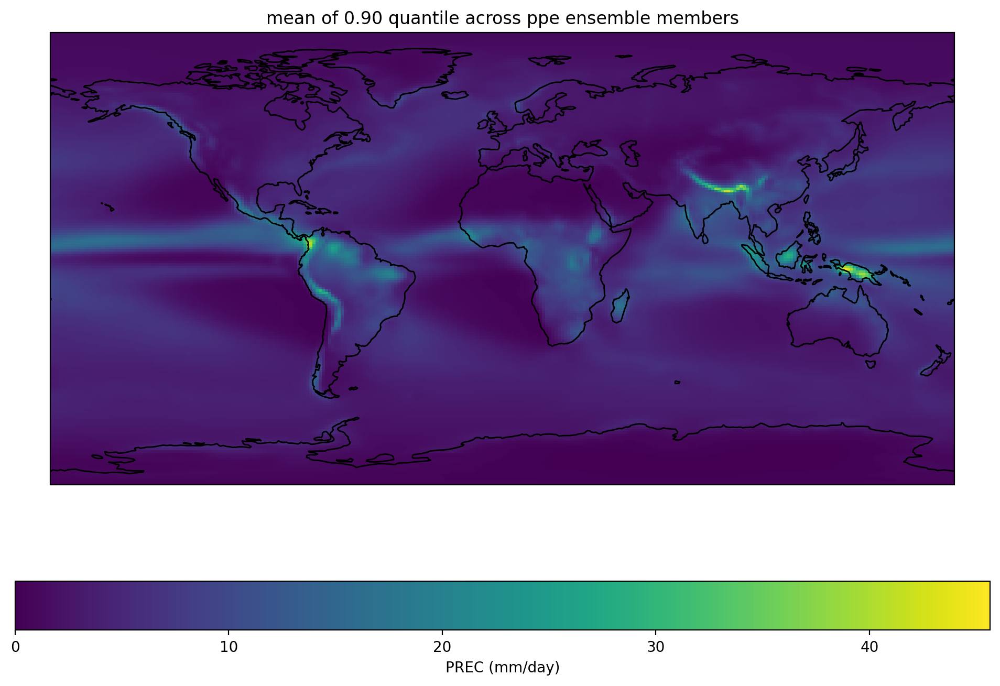

In [34]:
quant_plot_mean = (ppe_prec_quant90.mean(dim ='ensemble').
                   plot(figsize=(12, 8),
                        vmin = 0,
                        vmax = upper_bnd,
                        subplot_kws={'transform': ccrs.PlateCarree(),
                                     'projection': ccrs.PlateCarree()},
                        cbar_kwargs={'orientation': 'horizontal',
                                    'label': 'PREC (mm/day)'}))
quant_plot_mean.axes.coastlines()
plt.title('mean of 0.90 quantile across ppe ensemble members');
plt.savefig('ppe_prec_mean_090_quantile_plot.png')

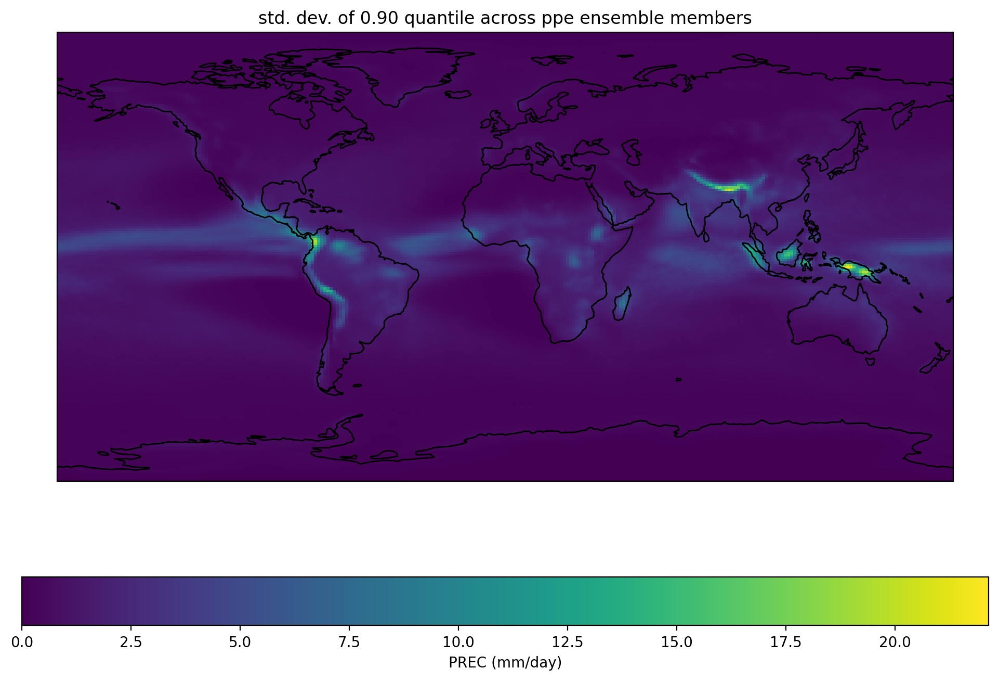

In [35]:
quant_plot_std = (ppe_prec_quant90.std(dim='ensemble').
              plot(figsize=(12, 8),
                   vmin = 0,
                   vmax = std_upper_bnd,
                   subplot_kws={'transform': ccrs.PlateCarree(),
                                'projection': ccrs.PlateCarree()},
                   cbar_kwargs={'orientation': 'horizontal',
                               'label': 'PREC (mm/day)'}))
quant_plot_std.axes.coastlines()
plt.title('std. dev. of 0.90 quantile across ppe ensemble members');
plt.savefig('ppe_prec_std_090_quantile_plot.png')

In [19]:
quant90_mean_diff = ppe_prec_quant90.mean(dim='ensemble') - cesm2_le50_q90.mean(dim = 'ensemble')

NameError: name 'ppe_prec_quant90' is not defined

In [30]:
quant90_std_ratio =  ppe_prec_quant90.std(dim='ensemble') / cesm2_le50_q90.std(dim = 'ensemble')

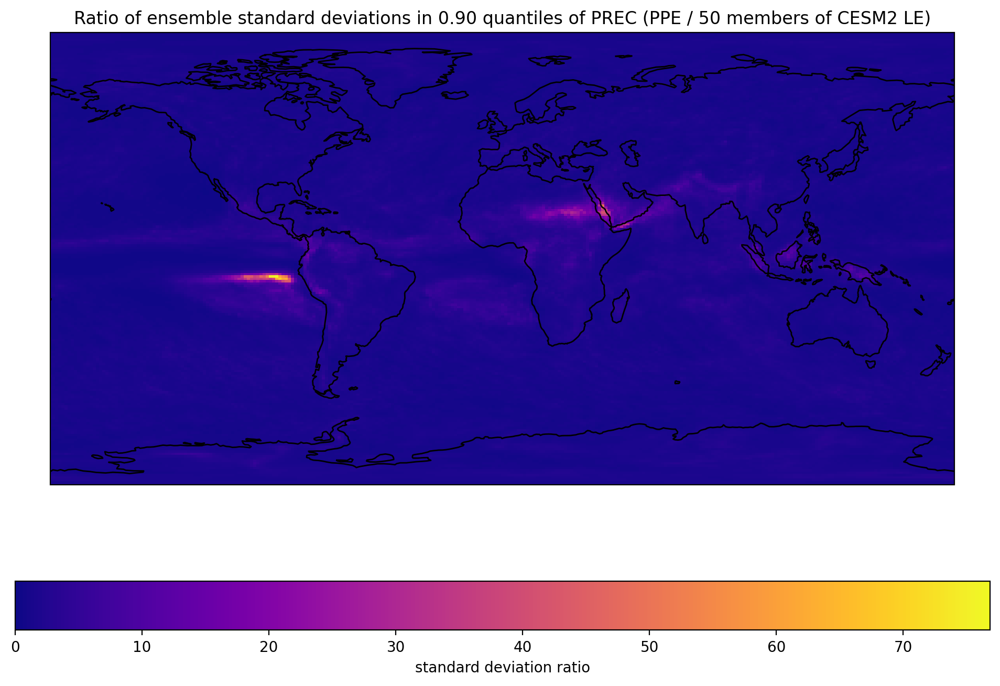

In [38]:
quant_plot_std_ratio = (quant90_std_ratio['PREC'].
              plot(figsize=(12, 8),
                   vmin = 0,
                   cmap = 'plasma',
                   subplot_kws={'transform': ccrs.PlateCarree(),
                                'projection': ccrs.PlateCarree()},
                   cbar_kwargs={'orientation': 'horizontal',
                               'label': 'standard deviation ratio'}))
quant_plot_std_ratio.axes.coastlines()
plt.title('Ratio of ensemble standard deviations in 0.90 quantiles of PREC (PPE / 50 members of CESM2 LE)');
plt.savefig('prec_std_ratio_090_quantle50_plot.png')

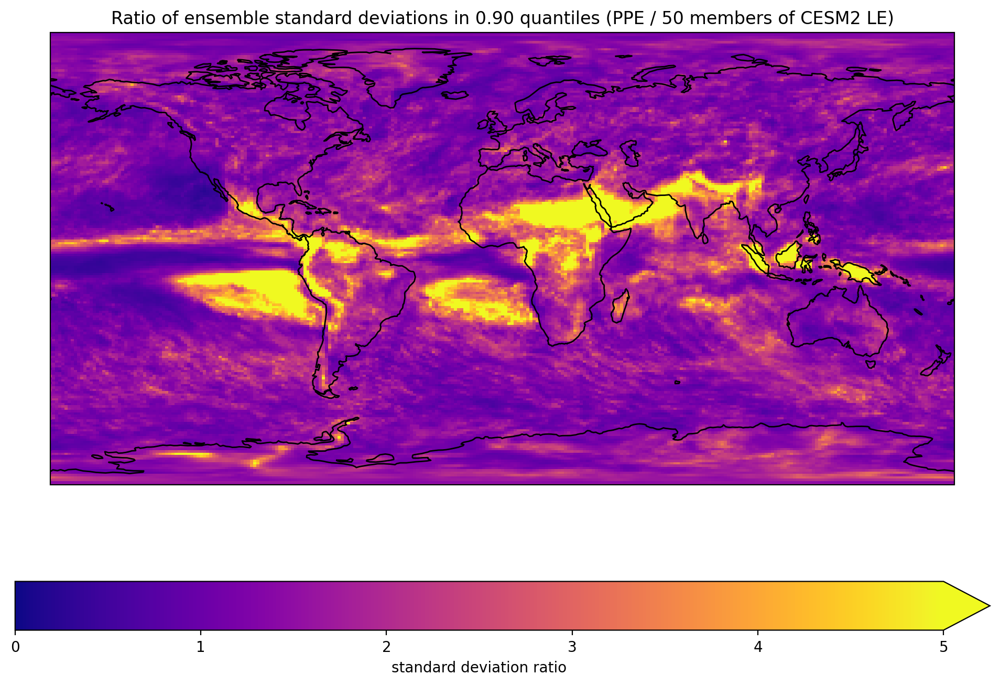

In [39]:
quant_plot_std_ratio_cl = (quant90_std_ratio['PREC'].
              plot(figsize=(12, 8),
                   cmap = 'plasma',
                   vmin = 0,
                   vmax = 5,
                   subplot_kws={'transform': ccrs.PlateCarree(),
                                'projection': ccrs.PlateCarree()},
                   cbar_kwargs={'orientation': 'horizontal',
                               'label': 'standard deviation ratio'}))
quant_plot_std_ratio_cl.axes.coastlines()
plt.title('Ratio of ensemble standard deviations in 0.90 quantiles (PPE / 50 members of CESM2 LE)');
plt.savefig('prec_std_ratio_090_le50_quant_plot_cl.png')

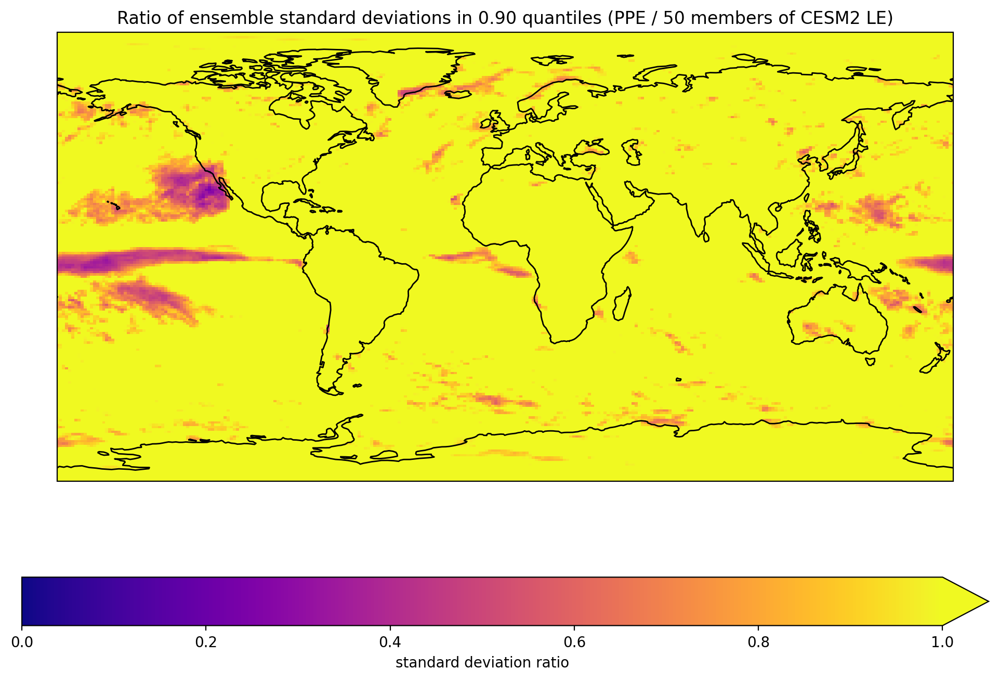

In [28]:
quant_plot_std_ratio_capped = (quant90_std_ratio['PREC'].
              plot(figsize=(12, 8),
                   cmap = 'plasma',
                   vmin = 0,
                   vmax = 1,
                   subplot_kws={'transform': ccrs.PlateCarree(),
                                'projection': ccrs.PlateCarree()},
                   cbar_kwargs={'orientation': 'horizontal',
                               'label': 'standard deviation ratio'}))
quant_plot_std_ratio_capped.axes.coastlines()
plt.title('Ratio of ensemble standard deviations in 0.90 quantiles (PPE / 50 members of CESM2 LE)');
plt.savefig('prec_std_ratio_090_le50_quant_plot_capped1.png')

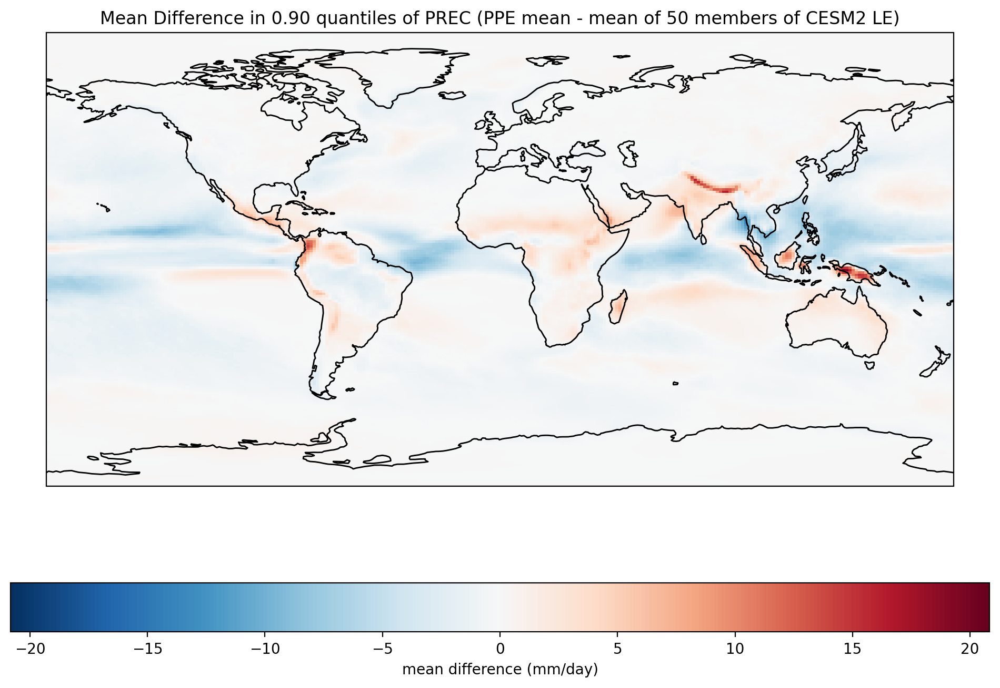

In [40]:
quant_plot_mean_diff = (quant90_mean_diff['PREC'].
              plot(figsize=(12, 8),
                   cmap = 'RdBu_r',
                   vmin = -np.max(quant90_mean_diff['PREC']),
                   vmax = np.max(quant90_mean_diff['PREC']),
                   subplot_kws={'transform': ccrs.PlateCarree(),
                                'projection': ccrs.PlateCarree()},
                   cbar_kwargs={'orientation': 'horizontal',
                               'label': 'mean difference (mm/day)'}))
quant_plot_mean_diff.axes.coastlines()
plt.title('Mean Difference in 0.90 quantiles of PREC (PPE mean - mean of 50 members of CESM2 LE)');
plt.savefig('mean_diff_090_quant_le50_plot.png')

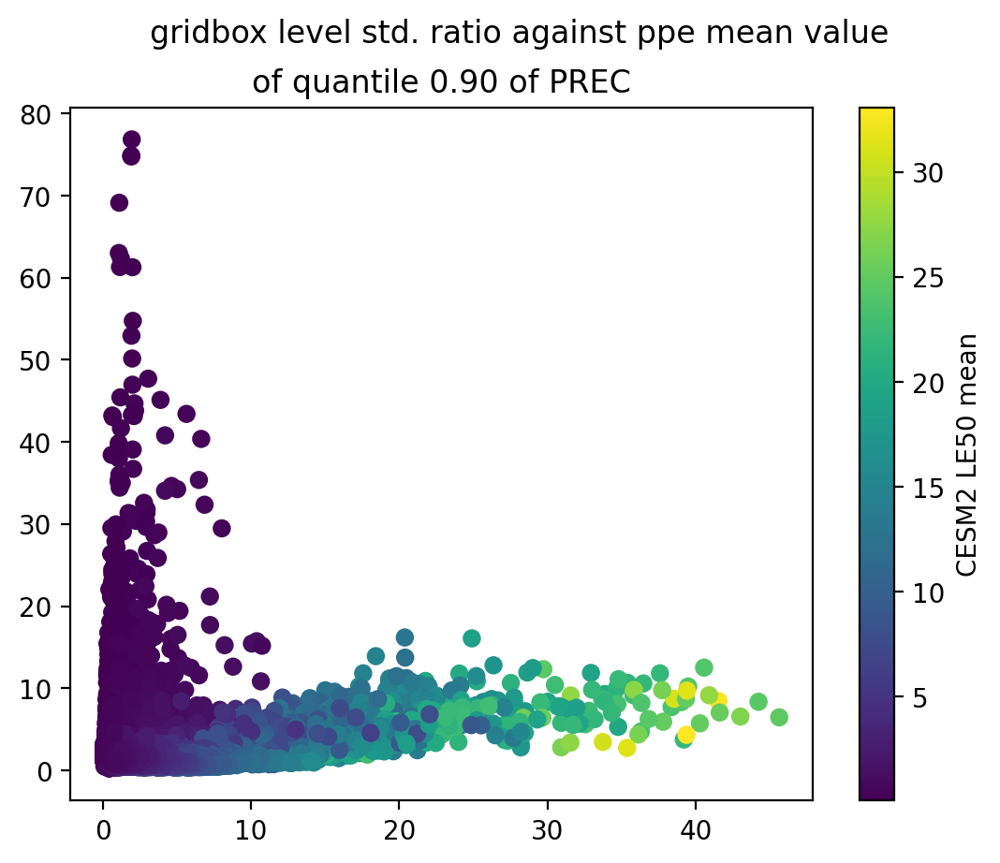

In [42]:
plt.scatter(ppe_prec_quant90.mean('ensemble').values, quant90_std_ratio['PREC'].values, 
            c = cesm2_le50_q90['PREC'].mean('ensemble').values,
           cmap = 'viridis')
plt.colorbar(label = 'CESM2 LE50 mean')
plt.suptitle('gridbox level std. ratio against ppe mean value')
plt.title('of quantile 0.90 of PREC')
plt.savefig('prec_q090_std_rat_ppe_mean_scatter.png');

In [35]:
std_ratio_mask = quant90_std_ratio['PREC'].values < 18

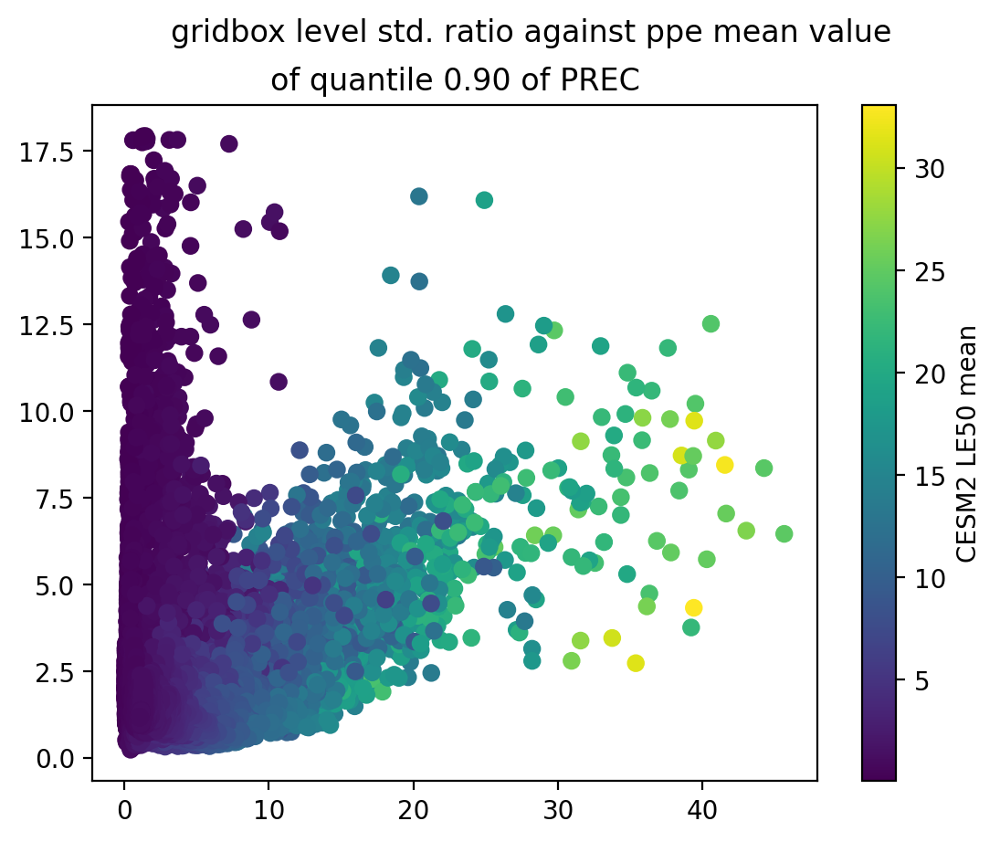

In [44]:
plt.scatter(ppe_prec_quant90.mean('ensemble').values[std_ratio_mask], quant90_std_ratio['PREC'].values[std_ratio_mask], 
            c = cesm2_le50_q90['PREC'].mean('ensemble').values[std_ratio_mask],
           cmap = 'viridis')
plt.colorbar(label = 'CESM2 LE50 mean')
plt.suptitle('gridbox level std. ratio against ppe mean value')
plt.title('of quantile 0.90 of PREC')
plt.savefig('prec_q090_std_rat_ppe_mean_scatter_zoom.png');

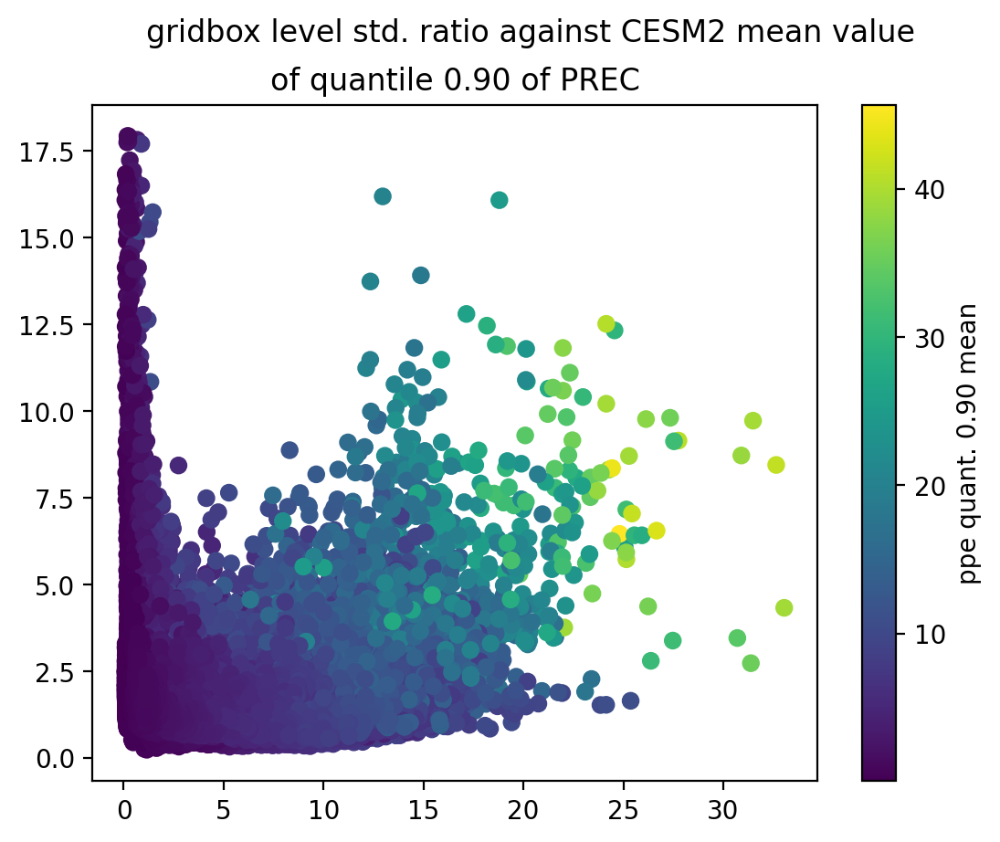

In [45]:
plt.scatter(cesm2_le50_q90['PREC'].mean('ensemble').values[std_ratio_mask], quant90_std_ratio['PREC'].values[std_ratio_mask], 
            c = ppe_prec_quant90.mean('ensemble').values[std_ratio_mask],
           cmap = 'viridis')
plt.colorbar(label = 'ppe quant. 0.90 mean')
plt.suptitle('gridbox level std. ratio against CESM2 mean value')
plt.title('of quantile 0.90 of PREC');

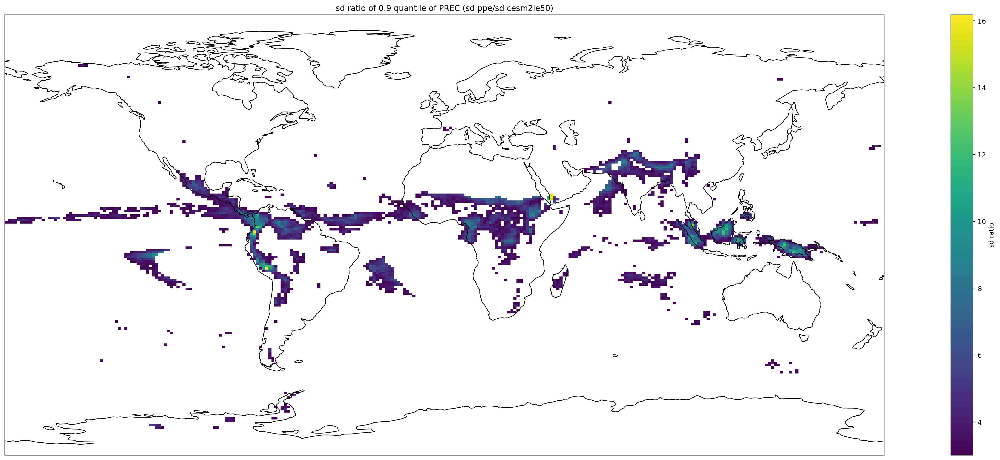

In [73]:
subset_ratio_plot = xr.where((cesm2_le50_q90['PREC'].mean('ensemble') > 1) & (quant90_std_ratio['PREC'] > 3),
                             quant90_std_ratio['PREC'],
                             np.nan).squeeze().plot(aspect = 3, size = 12,
                                                    subplot_kws = {'projection':ccrs.PlateCarree()},
                                         cbar_kwargs = {'label': 'sd ratio'})
plt.title('sd ratio of 0.9 quantile of PREC (sd ppe/sd cesm2le50)')

subset_ratio_plot.axes.coastlines();
#plt.savefig('prec_std_ratio_0.9_masked.png')

In [16]:
quant95_mean_diff['PREC']

<xarray.DataArray 'PREC' (lat: 95, lon: 288)> Size: 219kB
array([[3.28184520e-10, 3.28173795e-10, 3.28153707e-10, ...,
        3.28188544e-10, 3.28179740e-10, 3.28187379e-10],
       [3.11078727e-10, 3.00029482e-10, 2.91467325e-10, ...,
        3.33939586e-10, 3.28644459e-10, 3.21713481e-10],
       [6.71438169e-11, 5.28717162e-11, 3.75556474e-11, ...,
        8.25459785e-11, 7.83095799e-11, 7.44645739e-11],
       ...,
       [1.51240235e-09, 1.48792903e-09, 1.41838169e-09, ...,
        1.61938141e-09, 1.57530715e-09, 1.54655960e-09],
       [8.85714912e-10, 8.65651176e-10, 8.35698309e-10, ...,
        1.00284534e-09, 9.54699588e-10, 9.09017387e-10],
       [1.03820321e-09, 1.03753576e-09, 1.03667912e-09, ...,
        1.03696087e-09, 1.03430375e-09, 1.03783334e-09]])
Coordinates:
  * lat       (lat) float64 760B -90.0 -89.06 -88.12 -87.17 ... 86.23 89.06 90.0
  * lon       (lon) float64 2kB 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8
    quantile  float64 8B 0.95

In [26]:
np.min(quant95_std_ratio['PREC'])

<xarray.DataArray 'PREC' ()> Size: 8B
array(0.22565053)
Coordinates:
    quantile  float64 8B 0.95

In [27]:
ensemble_sd = ppe_prec_quant95.std('ensemble')

In [28]:
ensemble_sd = ensemble_sd.rename('prec_sd')

In [29]:
quant95_std_ratio

<xarray.Dataset> Size: 446kB
Dimensions:   (lat: 192, lon: 288)
Coordinates:
  * lat       (lat) float64 2kB -90.0 -89.06 -88.12 -87.17 ... 88.12 89.06 90.0
  * lon       (lon) float64 2kB 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8
    quantile  float64 8B 0.95
Data variables:
    PREC      (lat, lon) float64 442kB 1.149 1.149 1.149 ... 1.33 1.328 1.328

In [31]:
stacked_q95 = (quant95_std_ratio['PREC'].where(quant95_std_ratio['PREC'] > 5, drop = True).
     stack(x = ['lat', 'lon']))
extreme_coords = stacked_q95[stacked_q95.notnull()].x.values

In [21]:
extreme_coords[0][0]

-77.74869109947645

In [22]:
1 / 36

0.027777777777777776

In [23]:
test_lat, test_lon = extreme_coords[0]

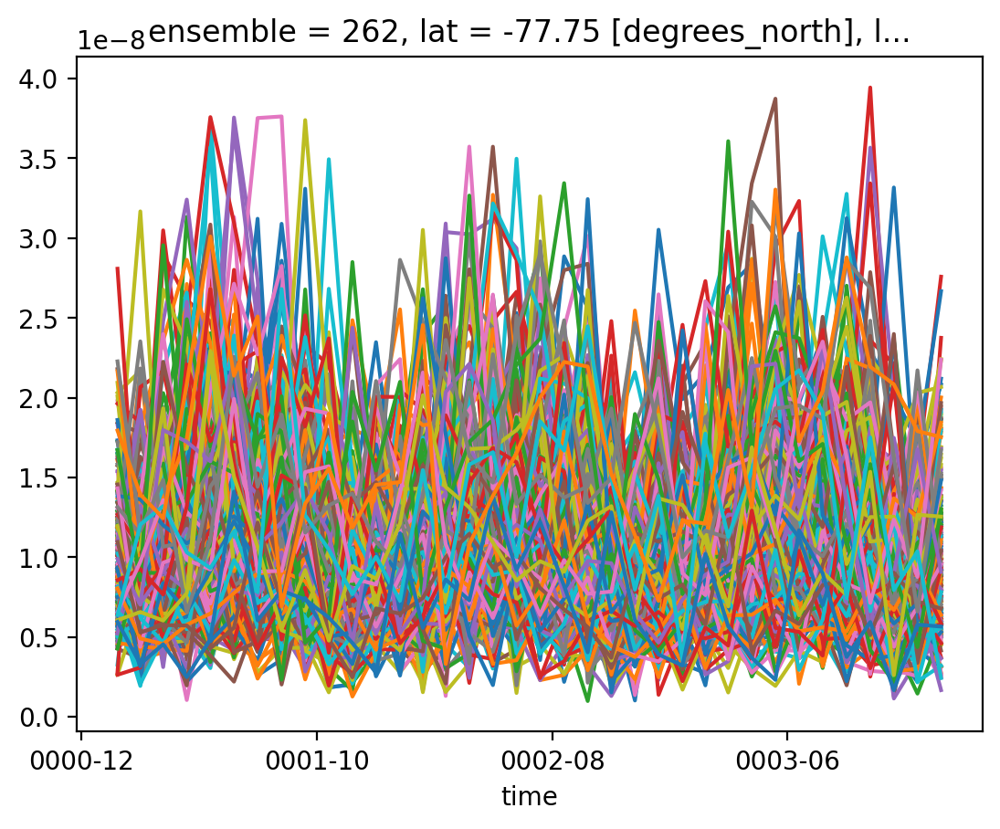

In [24]:
for ens in ds_prec.ensemble:
    ds_prec.sel(ensemble = ens, lat = test_lat, lon = test_lon).plot()

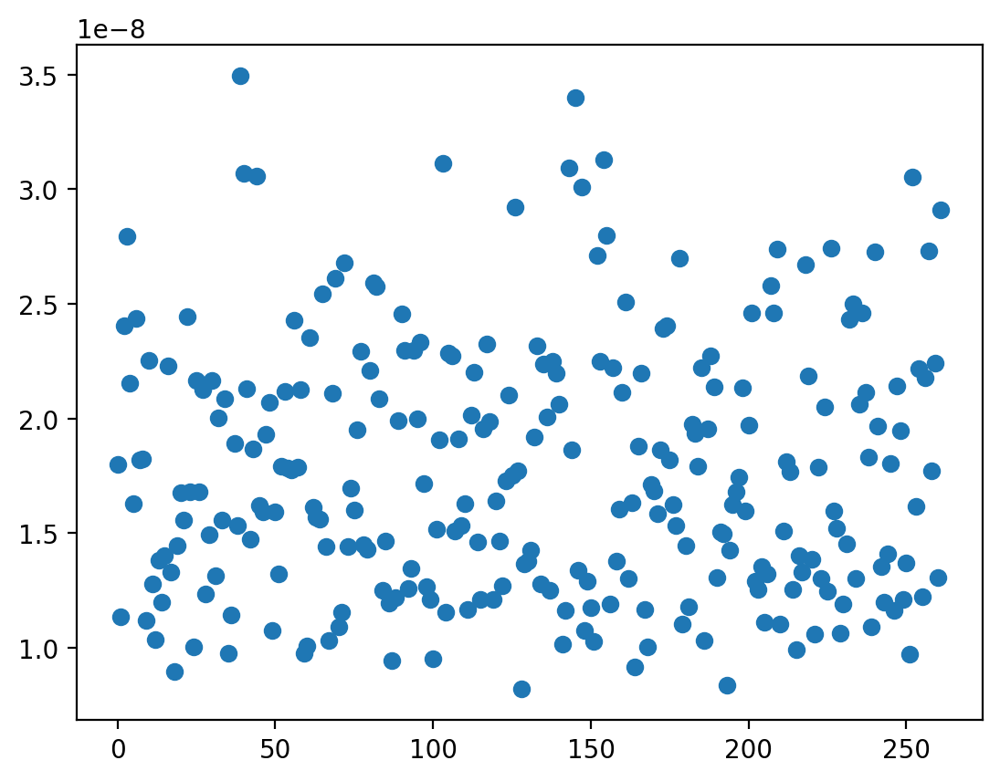

In [25]:
plt.scatter(np.arange(0, 262), ppe_prec_quant95.sel(lat = test_lat, lon = test_lon).values)

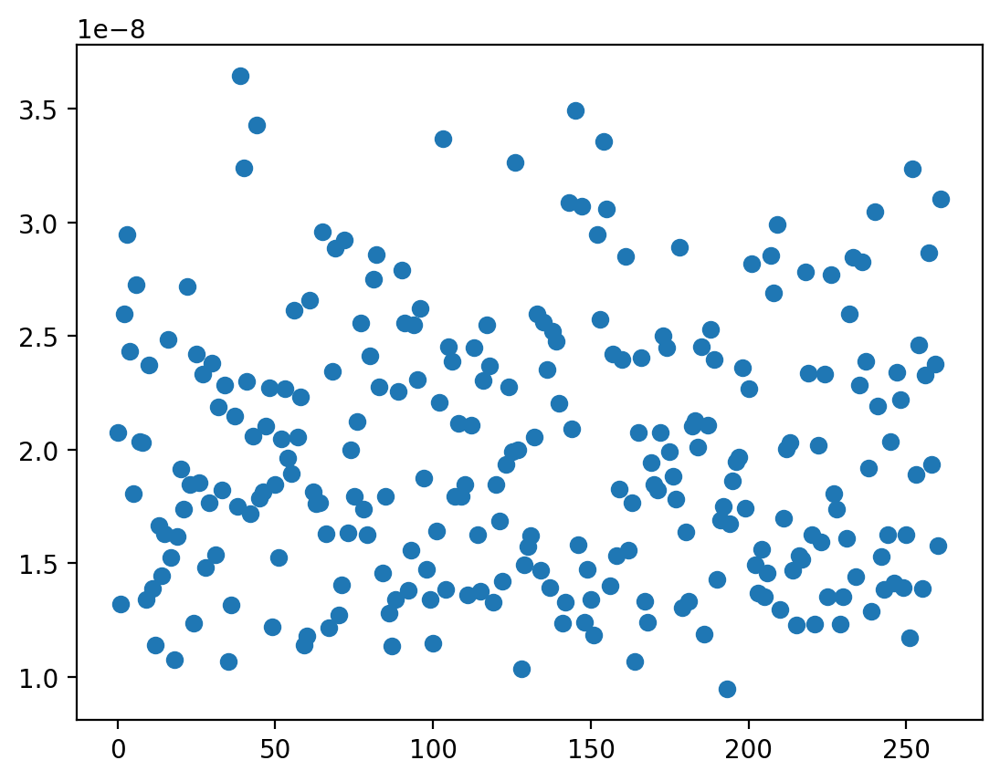

In [26]:
plt.scatter(np.arange(0, 262), ppe_prec_quant95.sel(lat = extreme_coords[1][0], lon = extreme_coords[1][1]).values)

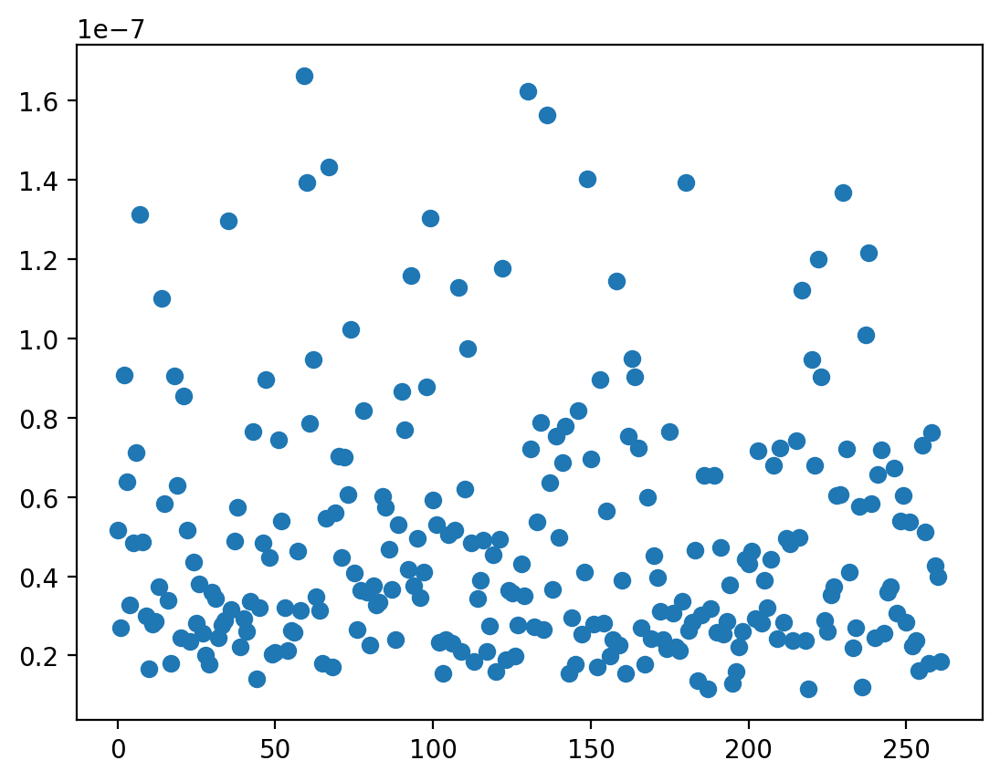

In [27]:
plt.scatter(np.arange(0, 262),
            ppe_prec_quant95.sel(lat = extreme_coords[2][0], lon = extreme_coords[2][1]).values)

In [28]:
np.where(ppe_prec_quant95.sel(lat = extreme_coords[2][0], lon = extreme_coords[2][1]).values > 1.4e-7)

(array([ 59,  67, 130, 136, 149]),)

In [29]:
np.where(ppe_prec_quant95.sel(lat = extreme_coords[0][0], lon = extreme_coords[0][1]).values > 3e-8)

(array([ 39,  40,  44, 103, 143, 145, 147, 154, 252]),)

In [30]:
test_ensembles = np.where(ppe_prec_quant95.sel(lat = extreme_coords[1][0], lon = extreme_coords[1][1]).values > 3e-8)

In [31]:
param_df = param_df.drop(columns = 'Sample_nmb')

In [32]:
param_df_std = (param_df - param_df.min()) / (param_df.max() - param_df.min())

<Axes: >

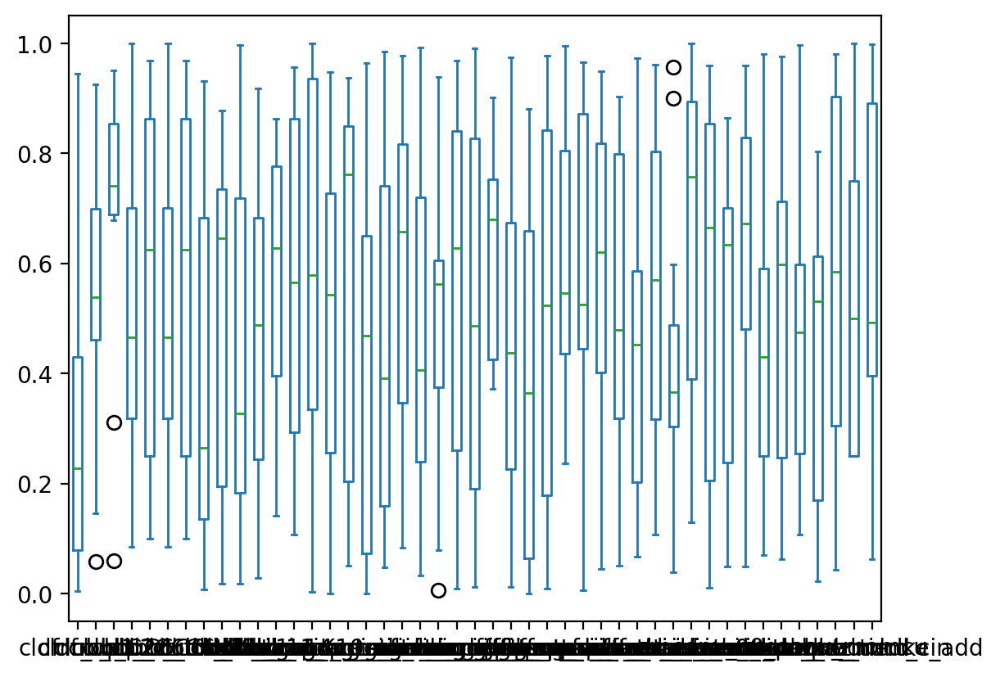

In [33]:
param_df_std.iloc[test_ensembles[0], :].plot.box()

In [34]:
param_df_std.columns

Index(['cldfrc_dp1', 'cldfrc_dp2', 'clubb_C2rt', 'clubb_C6rt', 'clubb_C6rtb',
       'clubb_C6thl', 'clubb_C6thlb', 'clubb_C8', 'clubb_beta', 'clubb_c1',
       'clubb_c11', 'clubb_c14', 'clubb_c_K10', 'clubb_gamma_coef',
       'clubb_wpxp_L_thresh', 'dust_emis_fact', 'micro_mg_accre_enhan_fact',
       'micro_mg_autocon_fact', 'micro_mg_autocon_lwp_exp',
       'micro_mg_autocon_nd_exp', 'micro_mg_berg_eff_factor', 'micro_mg_dcs',
       'micro_mg_effi_factor', 'micro_mg_homog_size', 'micro_mg_iaccr_factor',
       'micro_mg_max_nicons', 'micro_mg_vtrmi_factor',
       'microp_aero_npccn_scale', 'microp_aero_wsub_min',
       'microp_aero_wsub_scale', 'microp_aero_wsubi_min',
       'microp_aero_wsubi_scale', 'seasalt_emis_scale',
       'sol_factb_interstitial', 'sol_factic_interstitial', 'zmconv_c0_lnd',
       'zmconv_c0_ocn', 'zmconv_capelmt', 'zmconv_dmpdz', 'zmconv_ke',
       'zmconv_ke_lnd', 'zmconv_momcd', 'zmconv_momcu', 'zmconv_num_cin',
       'zmconv_tiedke_add'],
      

In [35]:
np.min(param_df_std['clubb_C2rt'])

0.0

In [36]:
np.max(param_df_std['clubb_C2rt'])

1.0

In [33]:
stacked_q95

<xarray.DataArray 'PREC' (x: 14484)> Size: 116kB
array([nan, nan, nan, ..., nan, nan, nan])
Coordinates:
    quantile  float64 8B 0.95
  * x         (x) object 116kB MultiIndex
  * lat       (x) float64 116kB -77.75 -77.75 -77.75 ... 36.28 36.28 36.28
  * lon       (x) float64 116kB 0.0 1.25 2.5 3.75 ... 355.0 356.2 357.5 358.8

In [38]:
quant95_std_ratio.where(quant95_std_ratio == quant95_std_ratio.max(), drop = True).coords

Coordinates:
  * lat       (lat) float64 8B -8.01
  * lon       (lon) float64 8B 268.8
    quantile  float64 8B 0.95

In [31]:
phis = xr.open_mfdataset('mean_phis_1990-1999.nc')

In [32]:
phis['PHIS'].values

array([[28237.387, 28237.387, 28237.387, ..., 28237.387, 28237.387,
        28237.387],
       [27043.012, 27074.184, 27108.893, ..., 26949.03 , 26980.059,
        27012.504],
       [26207.25 , 26272.969, 26340.521, ..., 26013.34 , 26077.402,
        26142.375],
       ...,
       [    0.   ,     0.   ,     0.   , ...,     0.   ,     0.   ,
            0.   ],
       [    0.   ,     0.   ,     0.   , ...,     0.   ,     0.   ,
            0.   ],
       [    0.   ,     0.   ,     0.   , ...,     0.   ,     0.   ,
            0.   ]], dtype=float32)

In [33]:
cesm_mean_mask = cesm2_le50_q90['PREC'].mean('ensemble') > 1

In [36]:
double_mask = std_ratio_mask & cesm_mean_mask.values

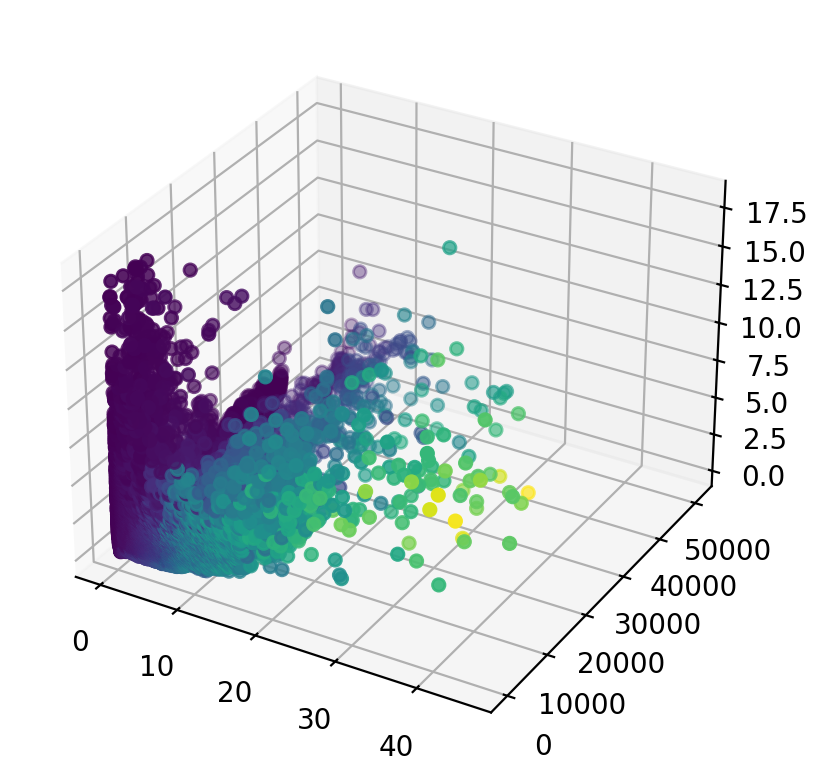

In [101]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(ppe_prec_quant90.mean('ensemble').values[std_ratio_mask],
           phis['PHIS'].values[std_ratio_mask],
           quant90_std_ratio['PREC'].values[std_ratio_mask],
        c = cesm2_le50_q90['PREC'].mean('ensemble').values[std_ratio_mask])
#ax.view_init(elev = 10, azim = -60)

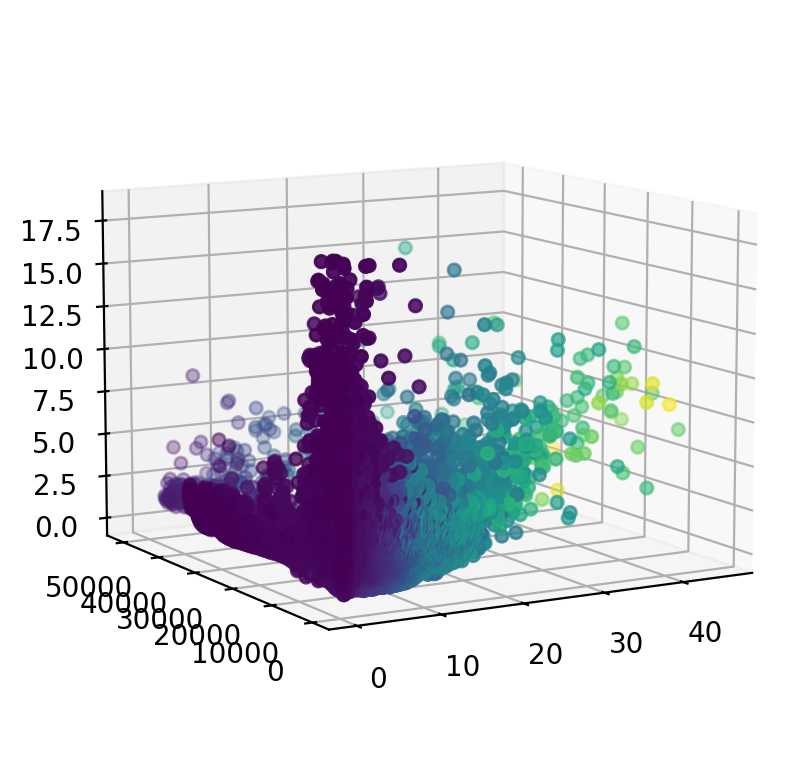

In [103]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(ppe_prec_quant90.mean('ensemble').values[std_ratio_mask],
           phis['PHIS'].values[std_ratio_mask],
           quant90_std_ratio['PREC'].values[std_ratio_mask],
        c = cesm2_le50_q90['PREC'].mean('ensemble').values[std_ratio_mask])
ax.view_init(elev = 10, azim = -120)

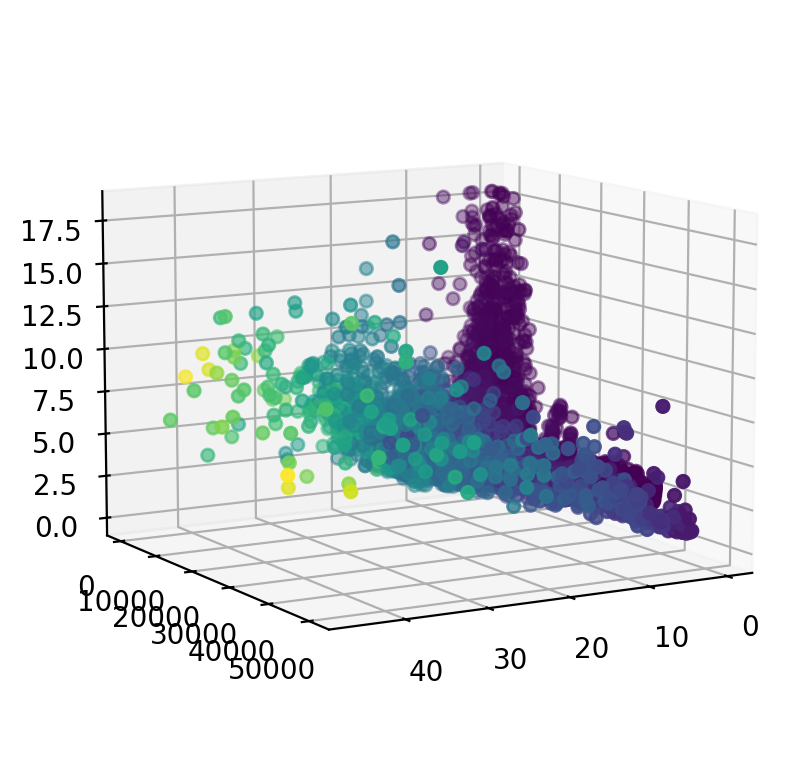

In [110]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(ppe_prec_quant90.mean('ensemble').values[std_ratio_mask],
           phis['PHIS'].values[std_ratio_mask],
           quant90_std_ratio['PREC'].values[std_ratio_mask],
        c = cesm2_le50_q90['PREC'].mean('ensemble').values[std_ratio_mask])
ax.view_init(elev = 10, azim = 60)

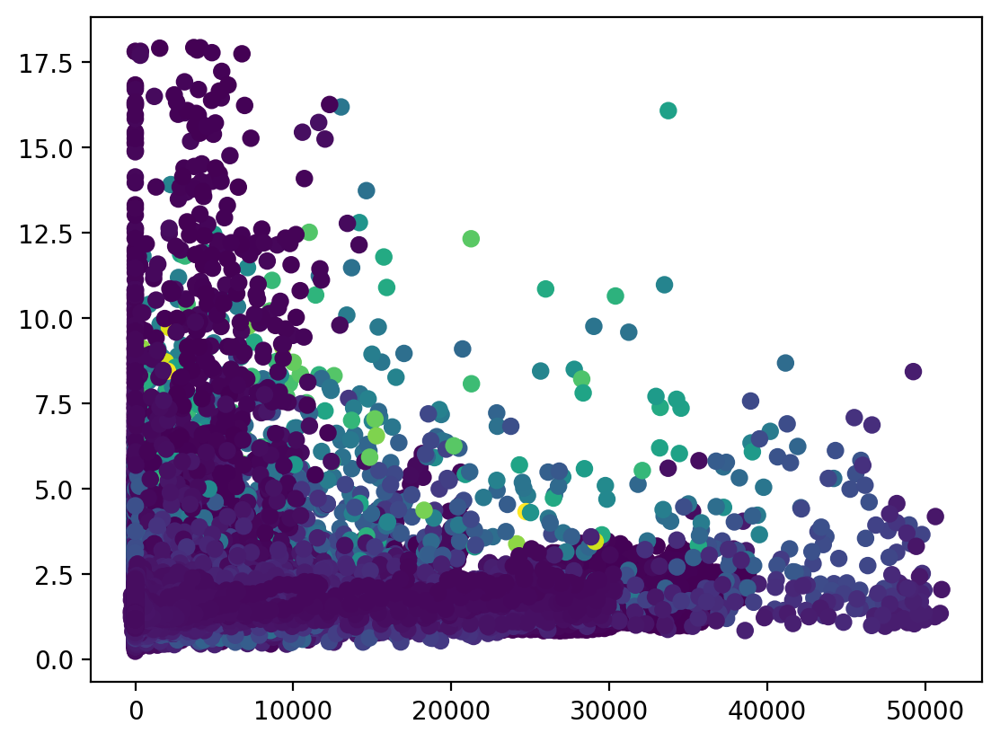

In [118]:
fig, ax = plt.subplots()
ax.scatter(phis['PHIS'].values[std_ratio_mask],
           quant90_std_ratio['PREC'].values[std_ratio_mask],
           c = cesm2_le50_q90['PREC'].mean('ensemble').values[std_ratio_mask])

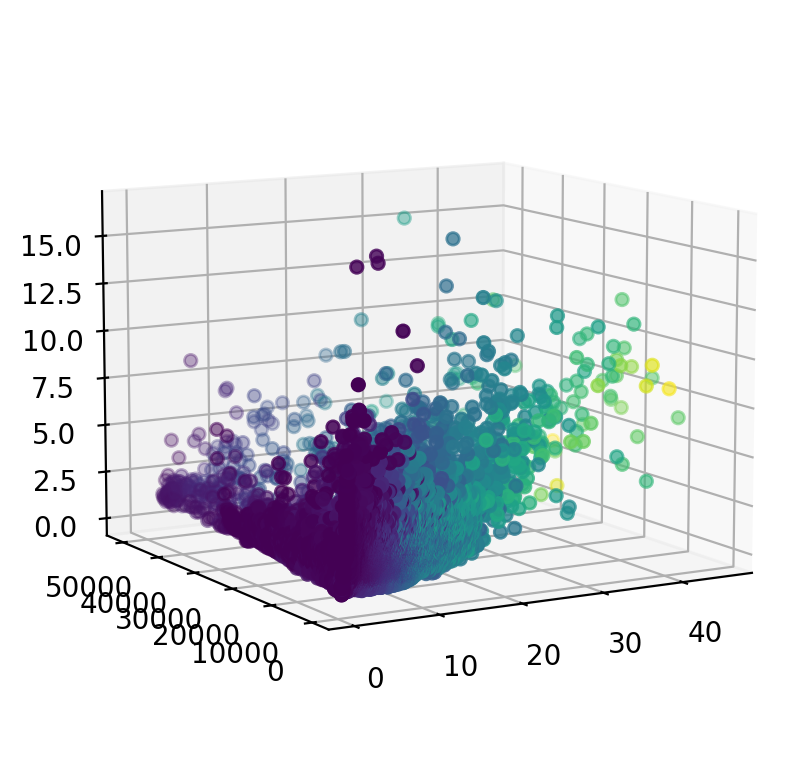

In [133]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(ppe_prec_quant90.mean('ensemble').values[double_mask],
           phis['PHIS'].values[double_mask],
           quant90_std_ratio['PREC'].values[double_mask],
        c = cesm2_le50_q90['PREC'].mean('ensemble').values[double_mask])
ax.view_init(elev = 10, azim = -120)

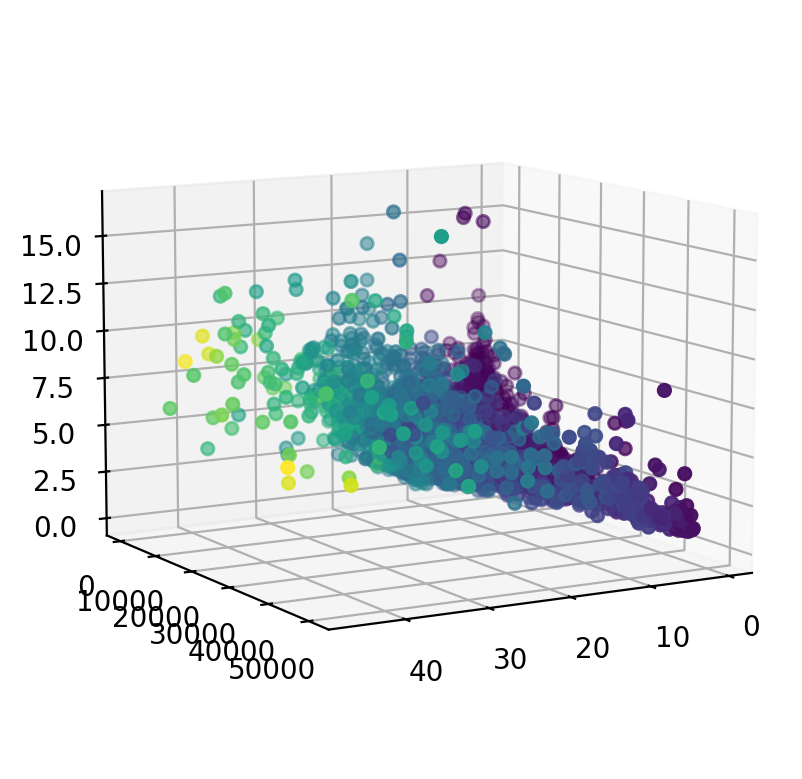

In [134]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(ppe_prec_quant90.mean('ensemble').values[double_mask],
           phis['PHIS'].values[double_mask],
           quant90_std_ratio['PREC'].values[double_mask],
        c = cesm2_le50_q90['PREC'].mean('ensemble').values[double_mask])
ax.view_init(elev = 10, azim = 60)

Text(0, 0.5, 'sd ratio')

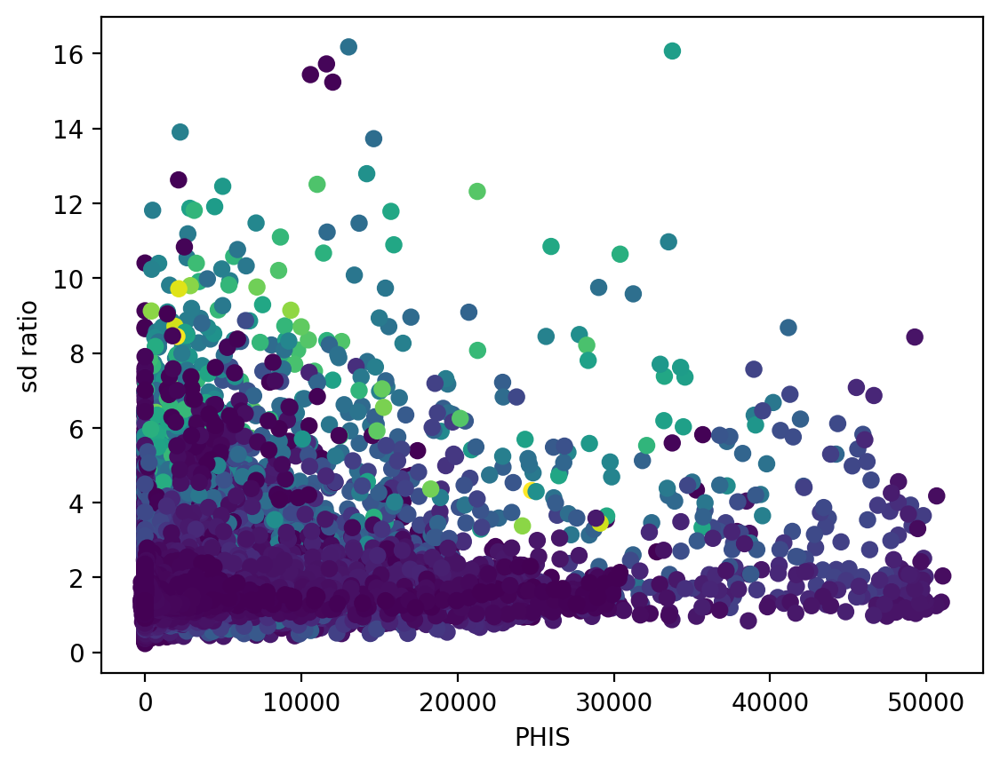

In [37]:
fig, ax = plt.subplots()
ax.scatter(phis['PHIS'].values[double_mask],
           quant90_std_ratio['PREC'].values[double_mask],
           c = cesm2_le50_q90['PREC'].mean('ensemble').values[double_mask])
plt.xlabel('PHIS')
plt.ylabel('sd ratio')

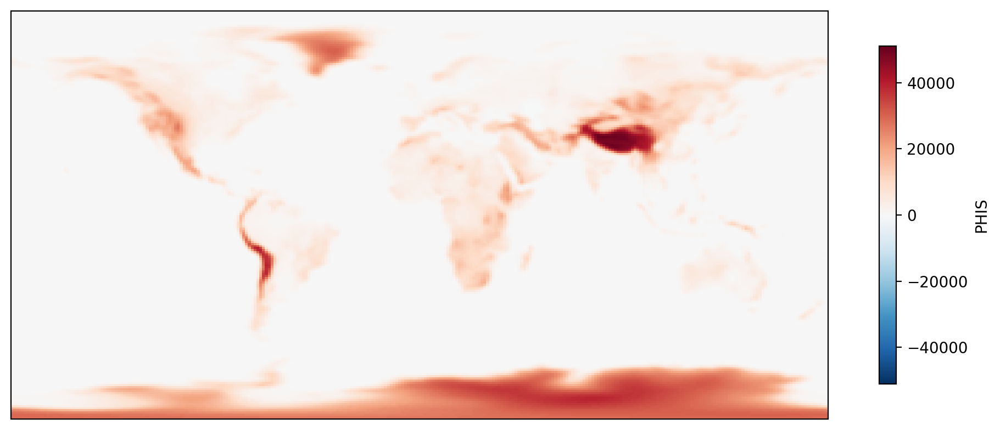

In [44]:
phis['PHIS'].plot(figsize = (12, 8),
                  subplot_kws={'projection': ccrs.PlateCarree()},
                 cbar_kwargs={'shrink': 0.5})